<a href="https://colab.research.google.com/github/Lee-jun-young98/Medical-Bigdata-Analysis-using-Python/blob/main/Hyperkvasir.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Mounted at /content/gdrive
All dataset classes and their corresponding RGB values in labels:
Class Names:  ['background', 'polyp']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]
Selected classes and their corresponding RGB values in labels:
Class Names:  ['background', 'polyp']
Class RGB values:  [[0, 0, 0], [255, 255, 255]]


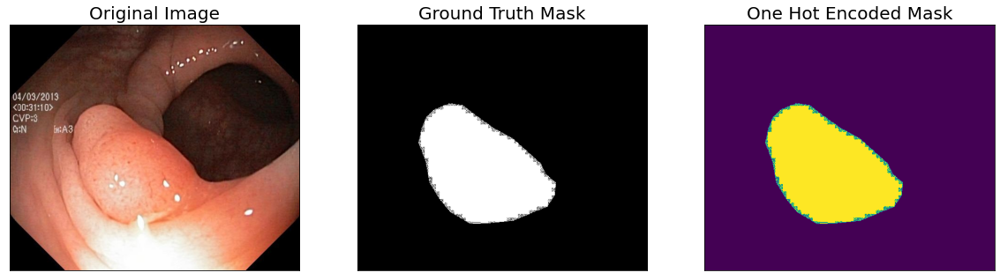

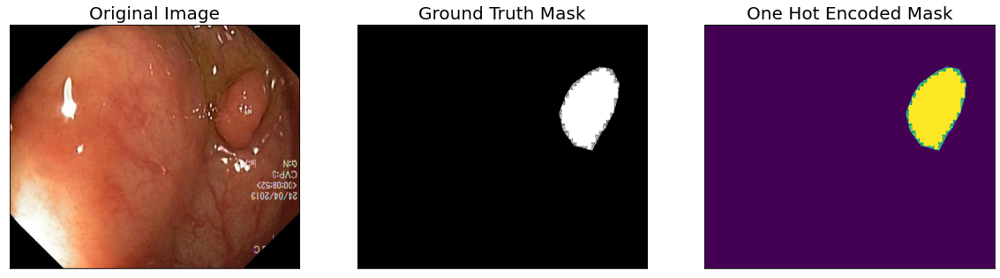

  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-npnwajrg
  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-npnwajrg

Epoch: 0
valid: 100%|██████████| 7/7 [00:35<00:00,  5.13s/it, dice_loss - 0.05749, iou_score - 0.9592]
Model saved!

Epoch: 1
valid: 100%|██████████| 7/7 [00:05<00:00,  1.20it/s, dice_loss - 0.05643, iou_score - 0.96]
Model saved!

Epoch: 2
valid: 100%|██████████| 7/7 [00:05<00:00,  1.22it/s, dice_loss - 0.05763, iou_score - 0.959]

Epoch: 3
valid: 100%|██████████| 7/7 [00:05<00:00,  1.22it/s, dice_loss - 0.05558, iou_score - 0.9612]
Model saved!

Epoch: 4
valid: 100%|██████████| 7/7 [00:05<00:00,  1.22it/s, dice_loss - 0.05638, iou_score - 0.9601]

Epoch: 5
valid: 100%|██████████| 7/7 [00:05<00:00,  1.21it/s, dice_loss - 0.05852, iou_score - 0.9584]

Epoch: 6
valid: 100%|██████████| 7/7 [00:05<00:00,  1.23it/s, dice_loss - 0.05657, iou_score - 0.9597]

Epoch: 7
valid: 100%|██████████| 7/7 [00:05<00:00,  1.22i

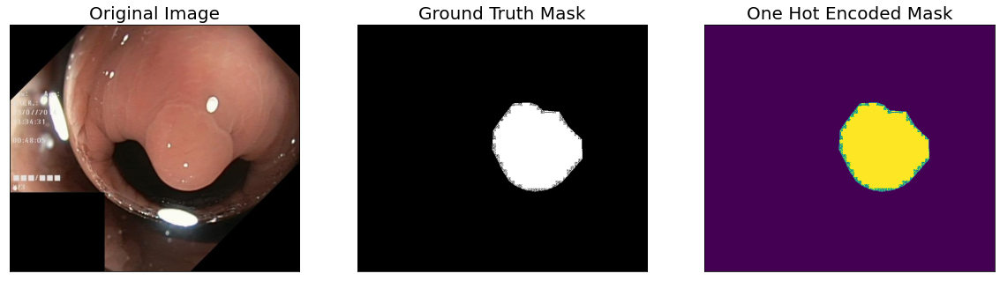

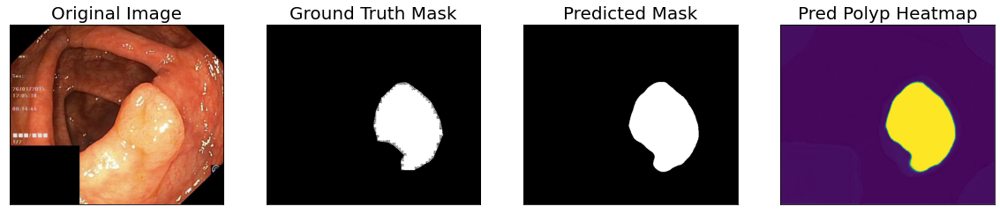

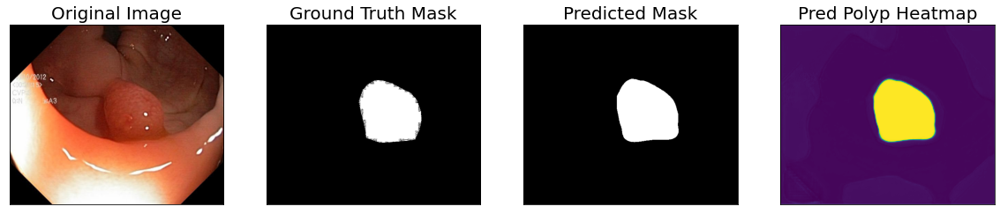

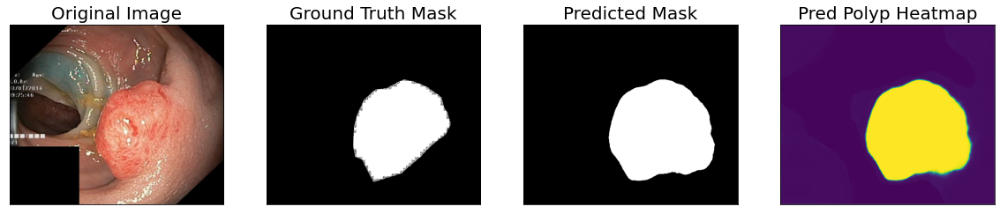

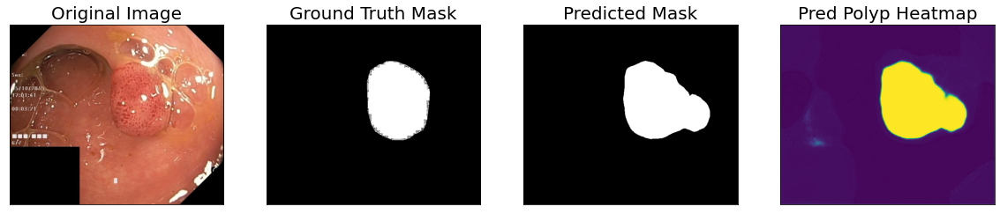

...

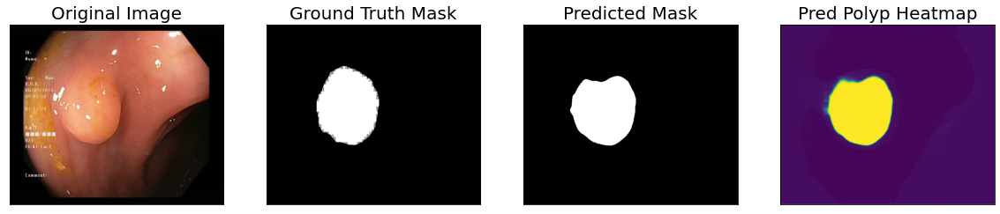

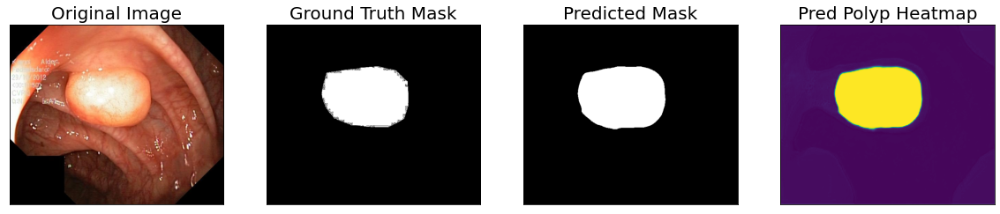

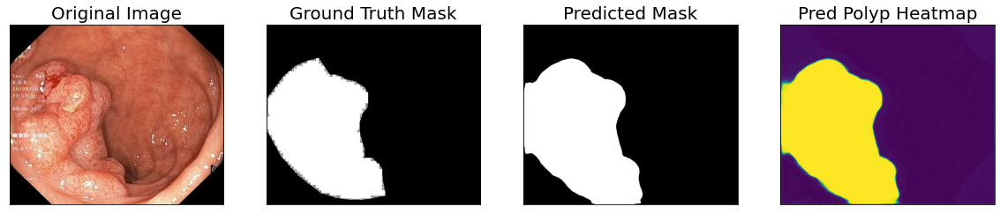

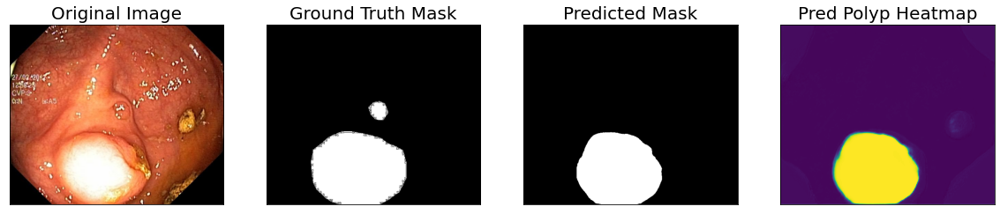

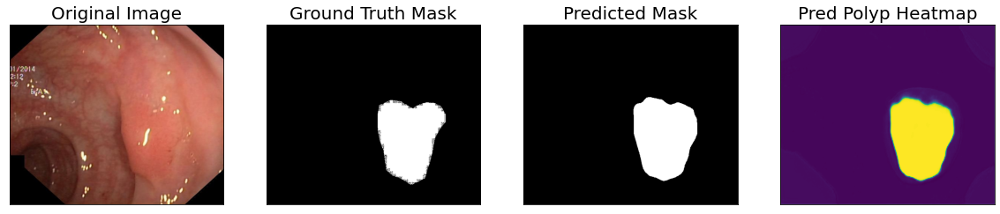

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

import pandas as pd
import os


os.chdir('/content/gdrive/My Drive/경진대회/Kvasir-SEG/')
os.getcwd()

# Commented out IPython magic to ensure Python compatibility.
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
# %matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album


DATA_DIR ='/content/gdrive/My Drive/경진대회/Kvasir-SEG/'

!pip install -q -U segmentation-models-pytorch albumentations > /dev/null
import segmentation_models_pytorch as smp

DATA_DIR ='/content/gdrive/My Drive/경진대회/Kvasir-SEG/'


image_list = os.listdir('/content/gdrive/My Drive/경진대회/Kvasir-SEG/images') # 지정한 디렉토리 내 모든 파일 리턴 받는 형식은 list 형식
mask_list = os.listdir('/content/gdrive/My Drive/경진대회/Kvasir-SEG/masks')

image_list = sorted(image_list)
mask_list = sorted(mask_list)

metadata_df = pd.DataFrame({'png_image_path':image_list,'png_mask_path':mask_list})

metadata_df

DATA_DIR ='/content/gdrive/My Drive/경진대회/Kvasir-SEG/images/'


metadata_df['png_image_path'] = metadata_df['png_image_path'].apply(lambda img_pth: os.path.join(DATA_DIR, img_pth)) # apply(lambda)를 이용하여 적용

DATA_DIR ='/content/gdrive/My Drive/경진대회/Kvasir-SEG/masks/'


metadata_df['png_mask_path'] = metadata_df['png_mask_path'].apply(lambda img_pth: os.path.join(DATA_DIR, img_pth))

metadata_df['png_image_path'][1]

metadata_df['png_mask_path'][1]

# Shuffle DataFrame
metadata_df = metadata_df.sample(frac=1).reset_index(drop=True) # 데이터프레임 섞기

# Perform 90/10 split for train / val
valid_df = metadata_df.sample(frac=0.1, random_state=42) # train, valid 셋 나누기
train_df = metadata_df.drop(valid_df.index)
len(train_df), len(valid_df)

class_dict = pd.read_csv(os.path.join('/content/gdrive/My Drive/경진대회/Kvasir-SEG/class_dict.csv'))
# Get class names
class_names = class_dict['class_names'].tolist()
# Get class RGB values
class_rgb_values = class_dict[['r','g','b']].values.tolist()

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)



select_classes = ['background', 'polyp']

# Get RGB values of required classes
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()): # .items() dictionary의 키 값 밸류 쌍을 줌
        plt.subplot(1, n_images, idx + 1) # subplot(row, column, index)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

# Perform one hot encoding on label
def one_hot_encode(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes
    # Arguments
        label: The 2D array segmentation image label
        label_values
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        class_map = np.all(equality, axis = -1) # 배열의 모든 데이터가 조건과 같으면 True 하나라도 다르면 False, axis=-1은 가장 낮은 차원을 기준으로 합침
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)

    return semantic_map
    
# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format (depth is num_classes),
    to a 2D array with only 1 channel, where each pixel value is
    the classified class key.
    # Arguments
        image: The one-hot format image 
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of 1, where each pixel value is the classified 
        class key.
    """
    x = np.argmax(image, axis = -1)
    return x

# Perform colour coding on the reverse-one-hot outputs
def colour_code_segmentation(image, label_values):
    """
    Given a 1-channel array of class keys, colour code the segmentation results.
    # Arguments
        image: single channel array where each value represents the class key.
        label_values

    # Returns
        Colour coded image for segmentation visualization
    """
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]

    return x

class EndoscopyDataset(torch.utils.data.Dataset):

    """CVC-ClinicDB Endoscopic Colonoscopy Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        df (str): DataFrame containing images / labels paths
        class_rgb_values (list): RGB values of select classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    def __init__(
            self, 
            df,
            class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        self.image_paths = df['png_image_path'].tolist()
        self.mask_paths = df['png_mask_path'].tolist()
        
        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read images and masks
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)
        
        # one-hot-encode the mask
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        # return length of 
        return len(self.image_paths)

dataset = EndoscopyDataset(train_df, class_rgb_values=select_class_rgb_values)
random_idx = random.randint(0, len(dataset)-1)
image, mask = dataset[1]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

def get_training_augmentation():
    train_transform = [
        album.Resize(height=512, width=608, interpolation=cv2.INTER_CUBIC, always_apply=True),
        album.HorizontalFlip(p=0.5),
        album.VerticalFlip(p=0.5),
    ]
    return album.Compose(train_transform)


def get_validation_augmentation():
    # Add sufficient padding to ensure image is divisible by 32
    test_transform = [
        album.Resize(height=512, width=608, interpolation=cv2.INTER_CUBIC, always_apply=True),
    ]
    return album.Compose(test_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')

def get_preprocessing(preprocessing_fn=None):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callable): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    """   
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)

augmented_dataset = EndoscopyDataset(
    train_df, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

random_idx = random.randint(0, len(augmented_dataset)-1)

# Different augmentations on image/mask pairs
for idx in range(1):
    image, mask = augmented_dataset[idx]
    visualize(
        original_image = image,
        ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
        one_hot_encoded_mask = reverse_one_hot(mask)
    )

image[1].shape

mask[1].shape

ENCODER = 'dpn131'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = select_classes
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation

# create segmentation model with pretrained encoder
model = smp.Unet(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

!pip install -U git+https://github.com/albu/albumentations --no-cache-dir

# Get train and val dataset instances
import albumentations.pytorch
train_dataset = EndoscopyDataset(
    train_df, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = EndoscopyDataset(
    valid_df, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

# Get train and val data loaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle=False, num_workers=4)

# Set flag to train the model or not. If set to 'False', only prediction is performed (using an older model checkpoint)
TRAINING = True

# Set num of epochs
EPOCHS = 20

# Set device: `cuda` or `cpu`
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# define loss function
loss = smp.utils.losses.DiceLoss()

# define metrics
metrics = [
    smp.utils.metrics.IoU(threshold=0.5),
]

# define optimizer
optimizer = torch.optim.Adam([ 
    dict(params=model.parameters(), lr=0.0001),
])

# define learning rate scheduler (not used in this NB)
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5,
)

if os.path.exists('/content/gdrive/My Drive/경진대회/Kvasir-SEG/best_model.pth'):
    model = torch.load('/content/gdrive/My Drive/경진대회/Kvasir-SEG/best_model.pth', map_location=DEVICE)

train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

# Commented out IPython magic to ensure Python compatibility.

if TRAINING:

   best_iou_score = 0.0
   train_logs_list, valid_logs_list = [], []
 
   for i in range(0, EPOCHS):
      # Perform training & validation
      print('\nEpoch: {}'.format(i))
      train_logs = train_epoch.run(train_loader)
      valid_logs = valid_epoch.run(valid_loader)
      train_logs_list.append(train_logs)
      valid_logs_list.append(valid_logs)
 
      # Save model if a better val IoU score is obtained
      if best_iou_score < valid_logs['iou_score']:
          best_iou_score = valid_logs['iou_score']
          torch.save(model, './best_model.pth')
          print('Model saved!')



# load best saved model checkpoint from the current run
if os.path.exists('/content/gdrive/My Drive/경진대회/Kvasir-SEG/best_model.pth'):
    best_model = torch.load('/content/gdrive/My Drive/경진대회/Kvasir-SEG/best_model.pth', map_location=DEVICE)
    print('Loaded UNet model from this run.')

# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('/content/gdrive/My Drive/경진대회/Kvasir-SEG/best_model.pth'):
    best_model = torch.load('/content/gdrive/My Drive/경진대회/Kvasir-SEG/best_model.pth', map_location=DEVICE)
    print('Loaded UNet model from a previous commit.')

# create test dataloader to be used with UNet model (with preprocessing operation: to_tensor(...))
test_dataset = EndoscopyDataset(
    valid_df, 
    augmentation=get_validation_augmentation(), 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataloader = DataLoader(test_dataset)

# test dataset for visualization (without preprocessing augmentations & transformations)
test_dataset_vis = EndoscopyDataset(
    valid_df,
    class_rgb_values=select_class_rgb_values,
)

# get a random test image/mask index
random_idx = random.randint(0, len(test_dataset_vis)-1)
image, mask = test_dataset_vis[random_idx]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

# Notice the images / masks are 1536*1536 because of 18px padding on all sides. 
# This is to ensure the input image dimensions to UNet model are a multiple of 2 (to account for pooling & transpose conv. operations).

sample_preds_folder = '/content/gdrive/My Drive/경진대회/Kvasir-SEG/sample_predictions/'
if not os.path.exists(sample_preds_folder):
    os.makedirs(sample_preds_folder)

for idx in range(len(test_dataset)):

    image, gt_mask = test_dataset[idx]
    image_vis = test_dataset_vis[idx][0].astype('uint8')
    image_vis = cv2.resize(image_vis, (608, 512), interpolation=cv2.INTER_CUBIC)
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    # Predict test image
    pred_mask = best_model(x_tensor)
    pred_mask = pred_mask.detach().squeeze().cpu().numpy()
    # Convert pred_mask from `CHW` format to `HWC` format
    pred_mask = np.transpose(pred_mask,(1,2,0))
    # Get prediction channel corresponding to foreground
    pred_polyp_heatmap = pred_mask[:,:,select_classes.index('polyp')]
    pred_mask = colour_code_segmentation(reverse_one_hot(pred_mask), select_class_rgb_values)
    # Convert gt_mask from `CHW` format to `HWC` format
    gt_mask = np.transpose(gt_mask,(1,2,0))
    gt_mask = colour_code_segmentation(reverse_one_hot(gt_mask), select_class_rgb_values)
    cv2.imwrite(os.path.join(sample_preds_folder, f"sample_pred_{idx}.png"), np.hstack([image_vis, gt_mask, pred_mask])[:,:,::-1])
    
    visualize(
        original_image = image_vis,
        ground_truth_mask = gt_mask,
        predicted_mask = pred_mask,
        pred_polyp_heatmap = pred_polyp_heatmap
    )

